## Rover Project Test Notebook
This notebook contains the functions from the lesson and provides the scaffolding you need to test out your mapping methods.  The steps you need to complete in this notebook for the project are the following:

* First just run each of the cells in the notebook, examine the code and the results of each.
* Run the simulator in "Training Mode" and record some data. Note: the simulator may crash if you try to record a large (longer than a few minutes) dataset, but you don't need a ton of data, just some example images to work with.   
* Change the data directory path (2 cells below) to be the directory where you saved data
* Test out the functions provided on your data
* Write new functions (or modify existing ones) to report and map out detections of obstacles and rock samples (yellow rocks)
* Populate the `process_image()` function with the appropriate steps/functions to go from a raw image to a worldmap.
* Run the cell that calls `process_image()` using `moviepy` functions to create video output
* Once you have mapping working, move on to modifying `perception.py` and `decision.py` to allow your rover to navigate and map in autonomous mode!

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

**Run the next cell to get code highlighting in the markdown cells.**

In [1]:
%%HTML
<style> code {background-color : orange !important;} </style>

In [3]:
%matplotlib
#%matplotlib inline
#%matplotlib qt # Choose %matplotlib qt to plot to an interactive window (note it may show up behind your browser)
# Make some of the relevant imports
import cv2 # OpenCV for perspective transform
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import scipy.misc # For saving images as needed
import glob  # For reading in a list of images from a folder

Using matplotlib backend: Qt4Agg


## Quick Look at the Data
There's some example data provided in the `test_dataset` folder.  This basic dataset is enough to get you up and running but if you want to hone your methods more carefully you should record some data of your own to sample various scenarios in the simulator.  

Next, read in and display a random image from the `test_dataset` folder

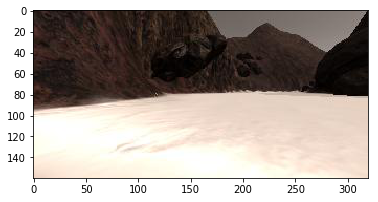

In [4]:
path = '../test_dataset/IMG/*'
img_list = glob.glob(path)
# Grab a random image and display it
idx = np.random.randint(0, len(img_list)-1)
image = mpimg.imread(img_list[idx])
%matplotlib inline
plt.imshow(image)

## Calibration Data
Read in and display example grid and rock sample calibration images.  You'll use the grid for perspective transform and the rock image for creating a new color selection that identifies these samples of interest. 

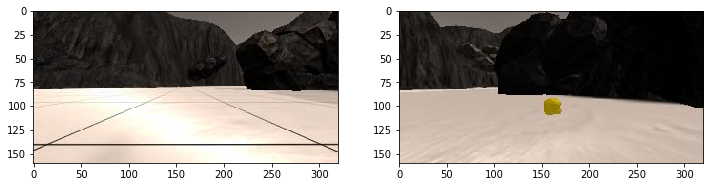

In [5]:
# In the simulator you can toggle on a grid on the ground for calibration
# You can also toggle on the rock samples with the 0 (zero) key.  
# Here's an example of the grid and one of the rocks
example_grid = '../calibration_images/example_grid1.jpg'
example_rock = '../calibration_images/example_rock1.jpg'
grid_img = mpimg.imread(example_grid)
rock_img = mpimg.imread(example_rock)

#%matplotlib qt
%matplotlib inline
fig = plt.figure(figsize=(12,3))
plt.subplot(121)
plt.imshow(grid_img)
plt.subplot(122)
plt.imshow(rock_img)


## Perspective Transform

Define the perspective transform function from the lesson and test it on an image.

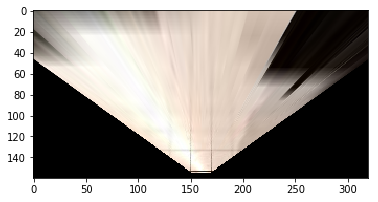

In [123]:
# Define a function to perform a perspective transform
# I've used the example grid image above to choose source points for the
# grid cell in front of the rover (each grid cell is 1 square meter in the sim)
# Define a function to perform a perspective transform
def perspect_transform(img, src, dst):
           
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))# keep same size as input image
    
    return warped


# Define calibration box in source (actual) and destination (desired) coordinates
# These source and destination points are defined to warp the image
# to a grid where each 10x10 pixel square represents 1 square meter
# The destination box will be 2*dst_size on each side
dst_size = 10 
# Set a bottom offset to account for the fact that the bottom of the image 
# is not the position of the rover but a bit in front of it
# this is just a rough guess, feel free to change it!
bottom_offset = 7
source = np.float32([[14, 140], [301 ,140],[200, 96], [118, 96]])
destination = np.float32([[image.shape[1]/2 - dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - 2*dst_size - bottom_offset], 
                  [image.shape[1]/2 - dst_size, image.shape[0] - 2*dst_size - bottom_offset],
                  ])
warped = perspect_transform(grid_img, source, destination)
warped_ball = perspect_transform(rock_img, source, destination)
plt.imshow(warped)
#scipy.misc.imsave('../output/warped_example.jpg', warped)

## Visualization Function

In [7]:
def vis_functions(img, fns, lables):
    f, axs = plt.subplots(1, len(fns), figsize=(30, 12))
    f.tight_layout()
    for ax, fn, lable in zip(axs, fns, lables):
        tmp = fn(img)
        if len(tmp.shape) == 3:
            ax.imshow(tmp)
        else:
            ax.imshow(tmp, cmap='gray')
        ax.set_title(lable, fontsize=25)

## Bluring images


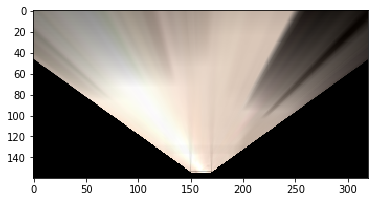

In [192]:
def blurImg(img):
    #blur = cv2.blur(img,(5,5))
    blur = cv2.GaussianBlur(img,(31,31),0)
    return blur
def blurImg2(img):
    blur = cv2.blur(img,(5,5))
    return blur

warped_blur = perspect_transform(blurImg2(grid_img), source, destination)
warped_ball_blur = perspect_transform(rock_img, source, destination)
plt.imshow(warped_blur)

## Masking Images

In [429]:
def maskImg(img, mask):
    return cv2.bitwise_and(img,img, mask=mask)

def maskRightSide(img):
    if len(img.shape) == 3:
        mask = np.zeros_like(img[:,:,0])
    else:
        mask = np.zeros_like(img[:,:])

    (w, h) = mask.shape
    
    #mask[int(h*7/10):h, int(w/2):int(w*6/10)] = 1
    #mask[:, int(w*6/10):] = 1
    #return maskImg(img, mask)
    mask[int(w*52/100):,int(h*75/100):] = 1
    
    mask = perspect_transform(mask, source, destination)
    return maskImg(img, mask)

def maskLeftSide(img):
    if len(img.shape) == 3:
        mask = np.zeros_like(img[:,:,0])
    else:
        mask = np.zeros_like(img[:,:])

    (w, h) = mask.shape
    #mask[:, :w/2] = 1
    #widths = [0, int(w*1/10), int(w*2/10), int(w*3/10), int(w*4/10), int(w*5/10)]
    #heights = [0, int(h*1/10), int(h*3/10), int(h*5/10), int(h*7/10), int(h*8.5/10) ]
    
    #for i in range(1, len(heights)):
    #    mask[0:heights[i], widths[i-1]:widths[i]] = 0
    
    mask[int(w*52/100):,:int(h*25/100)] = 1
    mask = perspect_transform(mask, source, destination)
    return maskImg(img, mask)

def maskStraightAhead(img):
    if len(img.shape) == 3:
        mask = np.zeros_like(img[:,:,0])
    else:
        mask = np.zeros_like(img[:,:])

    (w, h) = mask.shape
    #offsetW = w/10
    #offsetH = h/15
    #mask[int(w/2) - offsetW:w - offsetW, int(h/4) : int(h*3/4)] = 1
    #mask[ 0: int(w/2), h/2-offsetH: h/2+offsetH] = 1
    
    #return maskImg(img, mask)
    mask[int(w*52/100):,int(h*25/100): int(h*75/100)] = 1
    
    mask = perspect_transform(mask, source, destination)
    cnt, area = getBestContour(mask)
    print(area)
    return maskImg(img, mask)

def maskStraightLeftAhead(img):
    if len(img.shape) == 3:
        mask = np.zeros_like(img[:,:,0])
    else:
        mask = np.zeros_like(img[:,:])

    (w, h) = mask.shape
    mask[int(w*52/100):,int(h*25/100): int(h*50/100)] = 1
    mask = perspect_transform(mask, source, destination)
    return maskImg(img, mask)

def maskStraightRightAhead(img):
    if len(img.shape) == 3:
        mask = np.zeros_like(img[:,:,0])
    else:
        mask = np.zeros_like(img[:,:])

    (w, h) = mask.shape
    mask[int(w*52/100):,int(h*50/100): int(h*75/100) ] = 1
    mask = perspect_transform(mask, source, destination)
    return maskImg(img, mask)

def maskROI(img):
    if len(img.shape) == 3:
        mask = np.ones_like(img[:,:,0])
    else:
        mask = np.ones_like(img[:,:])

    mask = perspect_transform(mask, source, destination)
    kernel = np.ones((3,3),np.uint8)
    
    (h,w) = mask.shape
    
    mask[0:5,:] = 0
    mask[:,0:5] = 0
    mask[:,w-6:w-1] = 0
    mask = cv2.erode(mask, kernel, iterations=1)
    return maskImg(img, mask)

def maskUpperRock(img):
    if len(img.shape) == 3:
        mask = np.ones_like(img[:,:,0])
    else:
        mask = np.ones_like(img[:,:])

    (h,w) = mask.shape
    mask = perspect_transform(mask, source, destination)
    
    mask[:,:int(w*4/10)] = 0
    mask[:,int(w*6/10):] = 0
    mask[int(h*5/10):, int(w*4/10) : int(w*6/10)] = 0
    return mask

def maskLowerRock(img):
    if len(img.shape) == 3:
        mask = np.ones_like(img[:,:,0])
    else:
        mask = np.ones_like(img[:,:])

    (h,w) = mask.shape
    mask = perspect_transform(mask, source, destination)
    
    mask[:,:int(w*4/10)] = 0
    mask[:,int(w*6/10):] = 0
    mask[:int(h*5/10), int(w*4/10) : int(w*6/10)] = 0
    return mask

9882.5


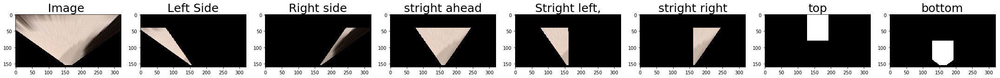

In [428]:
vis_functions(warped, [lambda x: x, maskLeftSide, maskRightSide, maskStraightAhead, maskStraightLeftAhead, maskStraightRightAhead, maskUpperRock, maskLowerRock], ["Image ", "Left Side", "Right side", "stright ahead", "Stright left,", "stright right", "top", "bottom"])

## Finding Cotours of Images

In [140]:
def getBestContour(threshold):
    im2,contours,hierarchy = cv2.findContours(threshold,cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = []
    area = 0
    for ct in contours:
        ctArea = cv2.contourArea(ct)
        if ctArea > area:
            area = ctArea
            cnt = ct
            
    return cnt, area

def approxByContour(threshold):
    im2,contours,hierarchy = cv2.findContours(threshold,cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    img = np.zeros_like(threshold)
    
    for cnt in contours:
        epsilon = 0.002 * cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, epsilon, True)
        cv2.fillPoly(img, [approx] , 255)
    return img

## Color Thresholding
Define the color thresholding function from the lesson and apply it to the warped image

**TODO:** Ultimately, you want your map to not just include navigable terrain but also obstacles and the positions of the rock samples you're searching for.  Modify this function or write a new function that returns the pixel locations of obstacles (areas below the threshold) and rock samples (yellow rocks in calibration images), such that you can map these areas into world coordinates as well.  
**Suggestion:** Think about imposing a lower and upper boundary in your color selection to be more specific about choosing colors.  Feel free to get creative and even bring in functions from other libraries.  Here's an example of [color selection](http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_colorspaces/py_colorspaces.html) using OpenCV.  
**Beware:** if you start manipulating images with OpenCV, keep in mind that it defaults to `BGR` instead of `RGB` color space when reading/writing images, so things can get confusing.

## Diferent Colour Spaces Thresholds

In [8]:
def HSL_threshold(img, lower, upper):
    HSL = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    HSL = cv2.inRange(HSL, lower, upper)
    return HSL

def LUV_threshold(img, lower, upper):
    LUV = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    LUV = cv2.inRange(LUV, lower, upper)
    return LUV

def LUV2_threshold(img, lower, upper):
    LUV = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    LUV = cv2.inRange(LUV, lower, upper)
    LUV2 = np.zeros_like(img[:,:,0])
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    LUV2[(LUV == 0)  & (gray!=0)] = 1
    return LUV2

def HSV_threshold(img, lower, upper):
    HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    HSV = cv2.inRange(HSV,lower, upper)
    return HSV

def YCC_threshold(img, lower, upper):
    yCrCb = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    yCrCb = cv2.inRange(yCrCb, lower, upper)
    return yCrCb

def YUV_threshold(img, lower, upper):
    yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    yuv = cv2.inRange(yuv, lower, upper)
    return yuv

def Lab_threshold(img, lower, upper):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab = cv2.inRange(lab, lower, upper)
    return lab

## Sand Threshold

In [163]:
def LUV_find_sand(img):
    return LUV_threshold(img,(80,50,40), (255,255,255))

def LUV2_find_sand(img):
    return LUV2_threshold(img, (0,50,40), (100,255,255))

def HSV_find_sand(img):
    return HSV_threshold(img, (0,30,180), (80,255,255))

def YCC_find_sand(img):
    return YCC_threshold(img, (127,100, 0), (255, 157, 147))

def YUV_find_sand(img):
    return YUV_threshold(img, (120,100, 0), (255, 140, 125))

def HSL_find_sand(img):
    return HSL_threshold(img, (0,50,80),(63,255,255))

def Lab_find_sand(img):
    img2 = Lab_threshold(img, (127,100, 128), (255, 255, 255))
    kernel = np.ones((5,5),np.uint8)
    img2 = cv2.dilate(img2,kernel,iterations = 1)
    img2 = cv2.erode(img2,kernel,iterations = 1)
    return img2

def sand_threshold(img):
    #HSL = HSL_find_sand(img)
    #LUV = LUV_find_sand(img)
    #LUV2 = LUV2_find_sand(img)
    #HSV = HSV_find_sand(img)
    #YCC = YCC_find_sand(img)
    #YUV = YUV_find_sand(img)
    
    Lab = Lab_find_sand(img)
    
    img2 = Lab
    return img2

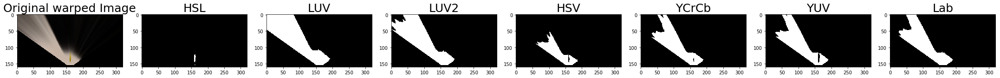

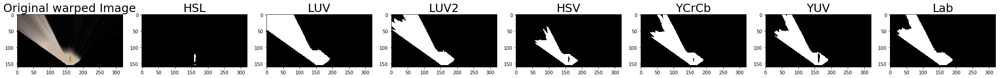

In [185]:
warped_rock1 = perspect_transform(blurImg(rock_img), source, destination)
warped_rock2 = perspect_transform(blurImg2(rock_img), source, destination)
fns = [lambda x: x, HSL_find_sand, LUV_find_sand, LUV2_find_sand, HSV_find_sand, YCC_find_sand, YUV_find_sand, Lab_find_sand]
lables = ['Original warped Image', 'HSL', 'LUV', 'LUV2', 'HSV', 'YCrCb', 'YUV', 'Lab']
vis_functions(warped_rock1, fns, lables)
vis_functions(warped_rock2, fns, lables)

## Rock Threshold

In [137]:
def LUV_find_rock(img):
    return LUV_threshold(img,(35,100, 100), (65, 160, 160)) 

def LUV2_find_rock(img):
    return LUV2_threshold(img, (65,50,40), (255,255,255))

def HSV_find_rock(img):
    return HSV_threshold(img, (0,30,0), (80,255,100))

def YCC_find_rock(img):
    return YCC_threshold(img, (0,112, 0), (102, 168, 127))

def YUV_find_rock(img):
    YUV = YUV_threshold(img, (0, 20, 20), (100, 200, 200))
    mask = np.ones_like(YUV)
    mask = perspect_transform(mask, source, destination)
    return maskImg(YUV, mask)

def HSL_find_rock(img):
    return HSL_threshold(img, (0,0,10),(31,102,163))

def Lab_find_rock(img):
    Lab = Lab_threshold(img, (0,108, 128), (102, 148, 255))
    mask = np.ones_like(Lab)
    mask = perspect_transform(mask, source, destination)
    return maskImg(Lab, mask)

def rock_threshold(img):
    rock = YUV_find_rock(img)
    kernel = np.ones((5,5),np.uint8)
    
    rock = cv2.dilate(rock,kernel,iterations = 2)
    rock = approxByContour(rock)
    rock = cv2.erode(rock,kernel,iterations = 2)
    
    return rock

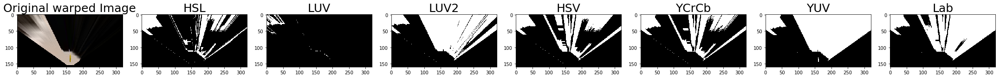

In [170]:
fns_rocks = [lambda x: x, HSL_find_rock, LUV_find_rock, LUV2_find_rock, HSV_find_rock, YCC_find_rock, YUV_find_rock, Lab_find_rock]
vis_functions(warped_rock, fns_rocks, lables)

## Ball Threshold

In [14]:
def LUV_find_ball(img):
    return LUV_threshold(img,(35,100, 100), (65, 160, 160)) 

def LUV2_find_ball(img):
    return LUV2_threshold(img, (65,50,40), (255,255,255))

def HSV_find_ball(img):
    return HSV_threshold(img, (0,30,0), (80,255,100))

def YCC_find_ball(img):
    return YCC_threshold(img, (0,112, 0), (102, 168, 127))

def YUV_find_ball(img):
    return YUV_threshold(img, (1, 20, 20), (100, 200, 200))

def HSL_find_ball(img):
    return HSL_threshold(img, (0,0,10),(31,102,163))

def Lab_find_ball(img):
    return Lab_threshold(img, (1,108, 128), (102, 148, 255))

def RGB_find_ball(img):
    return cv2.inRange(img, (100, 0, 0), (255, 255, 20))

def ball_threshold(img):
    return RGB_find_ball(img)

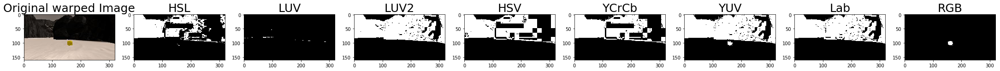

In [15]:
fns_ball = [lambda x: x, HSL_find_ball, LUV_find_ball, LUV2_find_ball, HSV_find_ball, YCC_find_ball, YUV_find_ball, Lab_find_ball, RGB_find_ball]
vis_functions(rock_img, fns_ball, lables + ["RGB"])

## Combined Threshold

In [168]:
def stacked_threshold(img):
    warped = perspect_transform(img, source, destination)
    sand = sand_threshold(warped)
    rock = rock_threshold(warped)
    ball = ball_threshold(warped)

    stacked = np.zeros_like(warped)
    stacked[:,:, 0] = sand
    stacked[:,:, 1] = rock
    stacked[:,:, 2] = ball
    return stacked

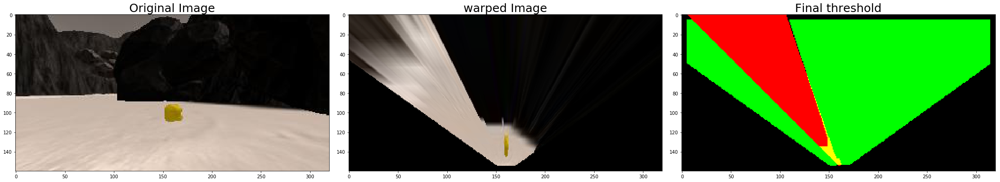

In [169]:
stacked = stacked_threshold(warped_ball)


f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 12))
f.tight_layout()
ax1.imshow(rock_img)
ax1.set_title('Original Image', fontsize=25)

ax2.imshow(warped_ball)
ax2.set_title('warped Image', fontsize=25)
    
ax3.imshow(stacked)
ax3.set_title('Final threshold', fontsize=25)

## Dead End / Corner Test

In [160]:
def warpImg(img):
    pt =  perspect_transform(img, source, destination)
    return pt
    #mask = np.zeros_like(pt[:,:,0])
    #mask[:, mask.shape[1]*3/8:] = 1
    #return cv2.bitwise_and(pt,pt, mask=mask)

def sand_test(img):
    warped = warpImg(img)
    return sand_threshold(warped)

def rock2_test(img):
    warped = warpImg(img)
    rt = rock_threshold(warped)
    return rt
    
def rock_test(img):
    warped = warpImg(img)
    rt = rock_threshold(warped)
    return approxByContour(rt)

def arrow(img):
    warped = warpImg(img)
    threshed = rock_threshold(warped)
    xpix, ypix = rover_coords(threshed)
    dist, angles = to_polar_coords(xpix, ypix)
    mean_dir = np.mean(angles)
  
    
    cnt, area = getBestContour(threshed)
    print(area)
    cv2.fillPoly(warped, [cnt], (0,255,0))
    #cv2.drawContours(warped, [cnt], -1, (0,255,0), 3)
    return warped
    
def wYUV(img):
    warped = warpImg(img)
    return YUV_find_sand(warped)

def wLab(img):
    warped = warpImg(img)
    
    img2 =  Lab_find_sand(warped)
    
    return img2
    
    


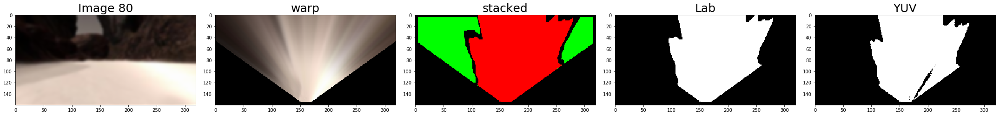

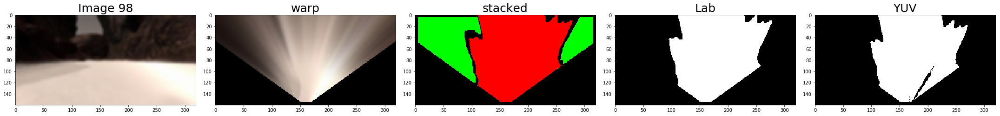

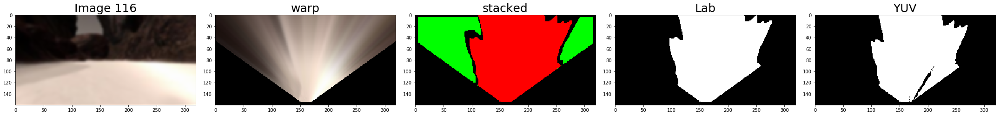

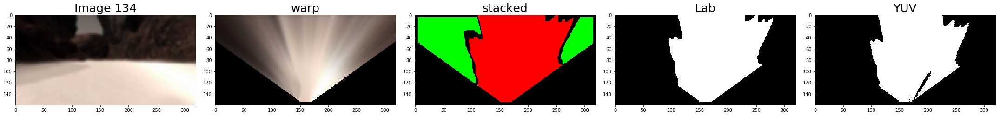

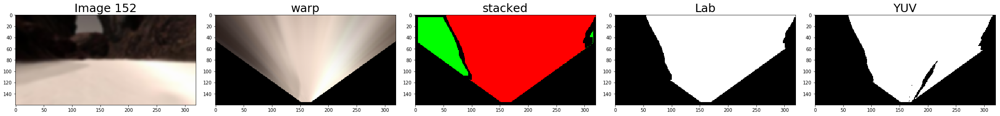

...

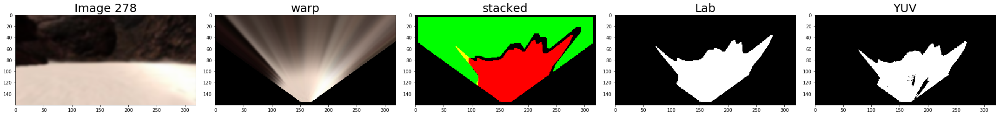

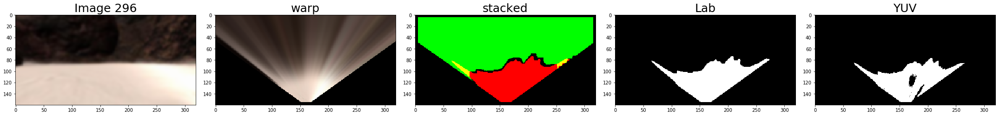

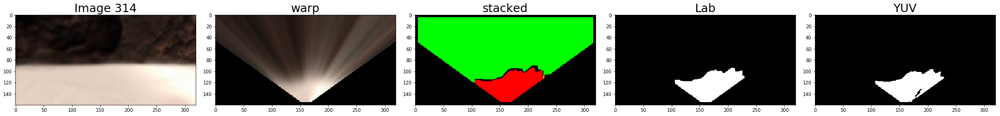

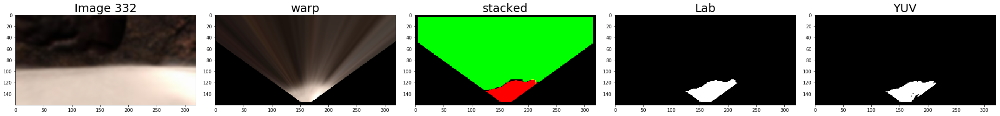

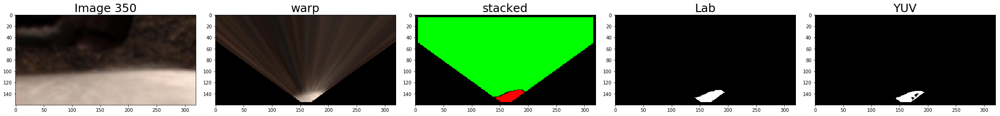

In [186]:
corner_path = '../test_dataset/corner_IMG/*'
img_corner_list = glob.glob(corner_path)
# Grab a random image and display it

n = len(img_corner_list)
for i in range(80,n, n//20):
    img = mpimg.imread(img_corner_list[i])
    vis_functions(blurImg(img), [lambda x: x, warpImg, stacked_threshold, wLab, wYUV], ["Image " + str(i), "warp", "stacked", "Lab", "YUV"])
    

## Corridor test

C:\Users\kmath\Anaconda3\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


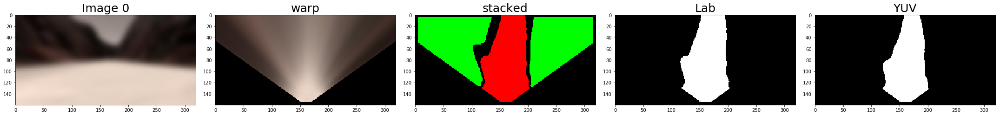

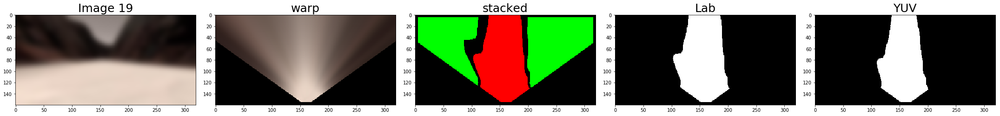

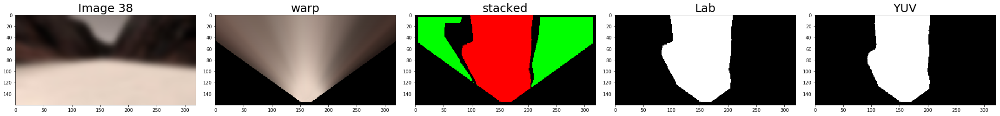

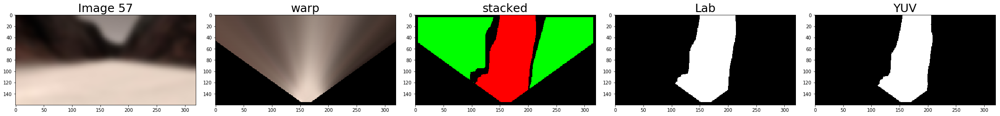

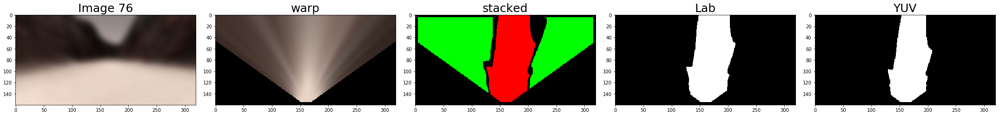

...

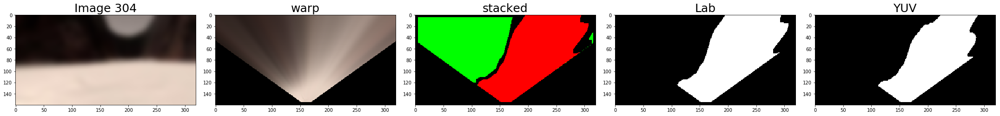

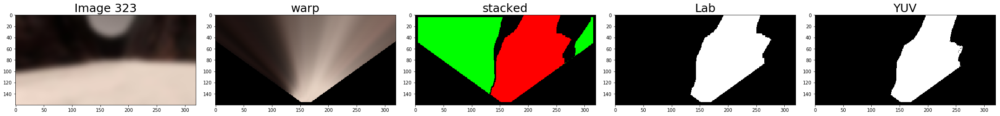

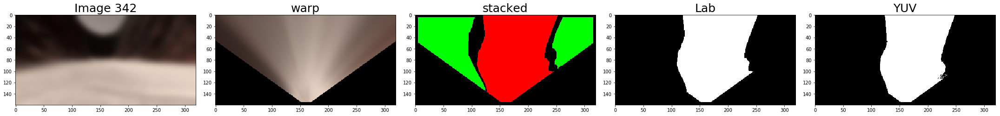

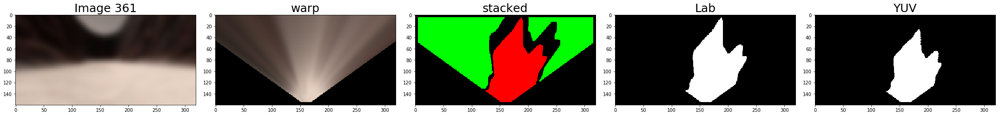

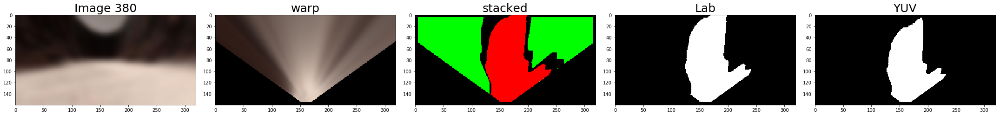

In [193]:
corridor_path = '../test_dataset/corridor_IMG/*'
img_corridor_list = glob.glob(corridor_path)
n = len(img_corridor_list)
for i in range(0,n, n//20):
    img = mpimg.imread(img_corridor_list[i])
    vis_functions(blurImg(img), [lambda x: x, warpImg, stacked_threshold, wLab, wYUV], ["Image " + str(i), "warp", "stacked", "Lab", "YUV"])

C:\Users\kmath\Anaconda3\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


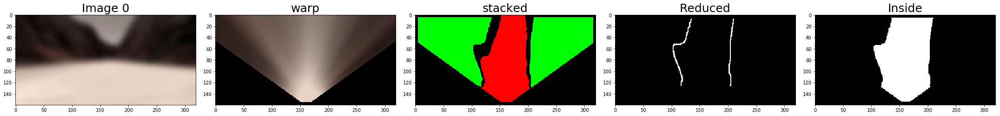

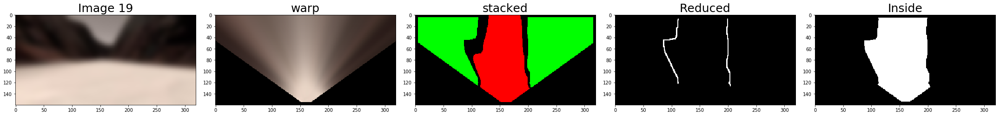

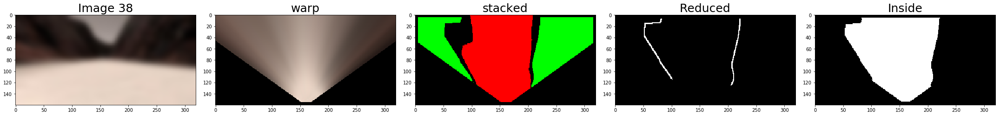

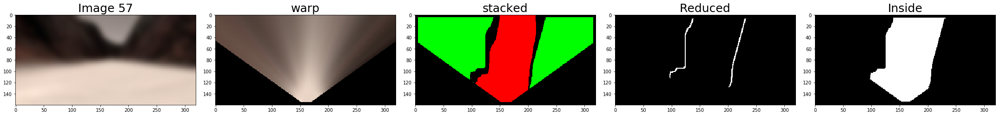

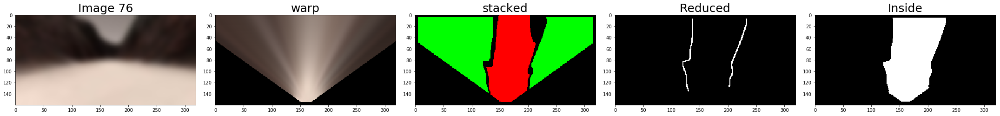

...

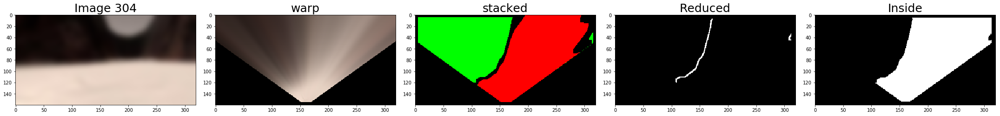

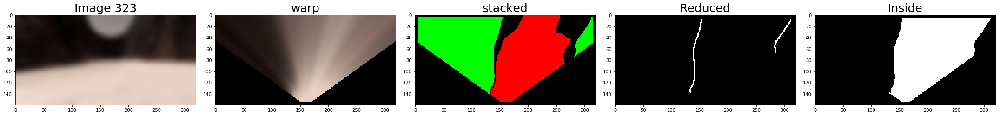

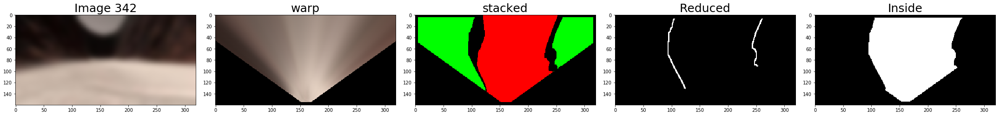

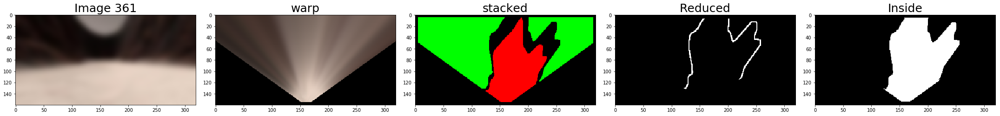

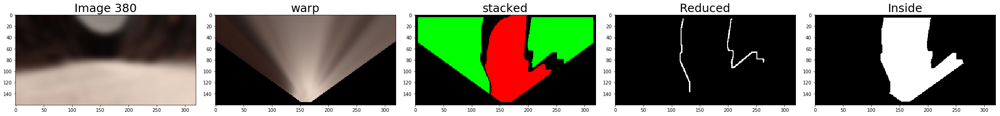

In [417]:
def reducedWalls(img):
    warped = warpImg(img)
    rock = rock_threshold(warped)
    sand = sand_threshold(warped)
    
    notRock = np.zeros_like(rock)
    cv2.bitwise_not(rock, notRock)
    notRock = maskROI(notRock)
    
    kernel = np.ones((3,3),np.uint8)
    
    rock = cv2.dilate(rock,kernel,iterations = 2)
    notRock = cv2.dilate(notRock,kernel,iterations = 2)
    rock = maskROI(rock)
    notRock = maskROI(notRock)
    
    rock = cv2.bitwise_and(rock, notRock)
    return cv2.erode(rock, kernel, iterations = 1)

def inSideOfWalls(img):
    warped = warpImg(img)
    rock = rock_threshold(warped)
    walls = reducedWalls(img)
    
    outside = cv2.bitwise_or(walls, rock)
    inside = cv2.bitwise_not(outside)
    inside = maskROI(inside)
    return inside

corridor_path = '../test_dataset/corridor_IMG/*'
img_corridor_list = glob.glob(corridor_path)
n = len(img_corridor_list)
for i in range(0,n, n//20):
    img = mpimg.imread(img_corridor_list[i])
    vis_functions(blurImg(img), [lambda x: x, warpImg, stacked_threshold, reducedWalls, inSideOfWalls], ["Image " + str(i), "warp", "stacked", "Reduced", "Inside"])

C:\Users\kmath\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:34: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
C:\Users\kmath\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
C:\Users\kmath\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:51: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


4167.5
4205.5
4031.5
4119.0
4153.5
4000.5
4052.0
4176.5
4358.5
4381.0
4477.5
4157.0
4111.0
3705.0
1266.0
0
24.0
586.5
2185.5
2558.5


C:\Users\kmath\Anaconda3\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


2450.0


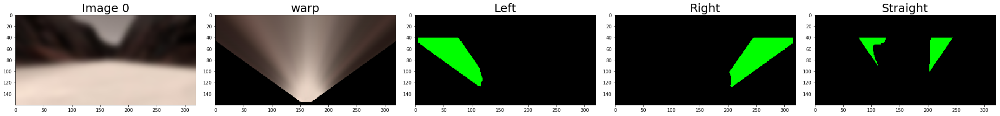

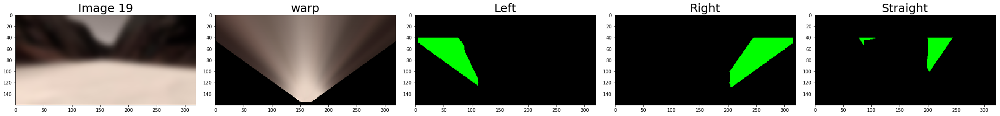

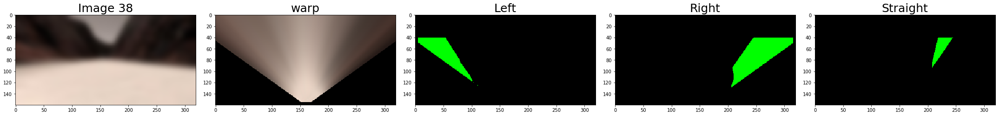

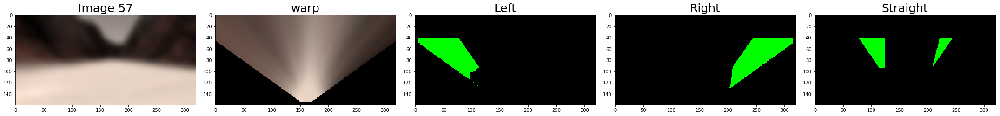

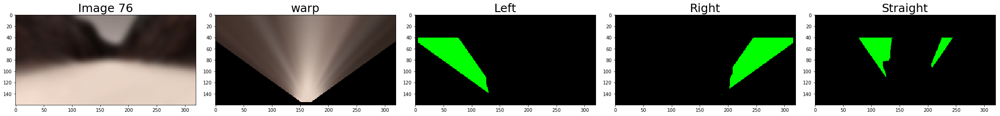

...

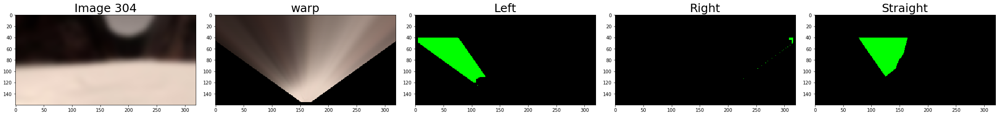

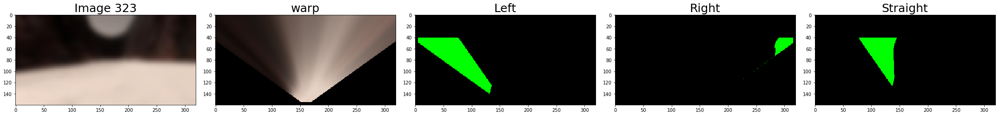

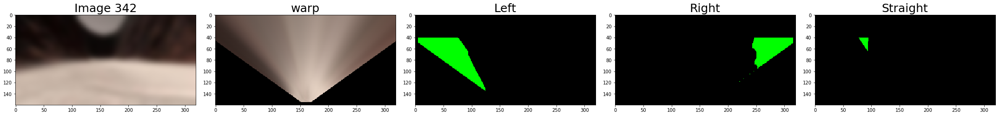

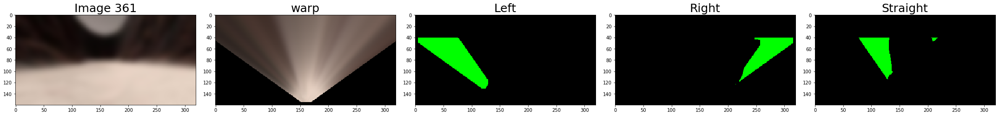

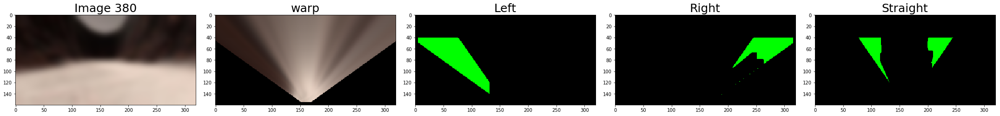

In [382]:
def left_wall_cor_mask_test(img):
    warped = perspect_transform(img, source, destination)
    rock = maskLeftSide(rock_threshold(warped))
    stacked = np.zeros_like(warped)
    stacked[:,:, 1] = rock
    cnt, area = getBestContour(rock)
    
    return stacked

def right_wall_cor_mask_test(img):
    warped = perspect_transform(img, source, destination)
    rock = maskRightSide(rock_threshold(warped))
    stacked = np.zeros_like(warped)
    stacked[:,:, 1] = rock
    cnt, area = getBestContour(rock)
    print(area)
    return stacked

def stright_wall_cor_mask_test(img):
    warped = perspect_transform(img, source, destination)
    rock = maskStraightAhead(rock_threshold(warped))
    stacked = np.zeros_like(warped)
    stacked[:,:, 1] = rock
    cnt, area = getBestContour(rock)
    return stacked

n = len(img_corridor_list)
for i in range(0,n, n//20):
    img = mpimg.imread(img_corridor_list[i])
    vis_functions(blurImg(img), [lambda x: x, warpImg, left_wall_cor_mask_test, right_wall_cor_mask_test, stright_wall_cor_mask_test], ["Image " + str(i), "warp", "Left", "Right", "Straight"])

## Small rock test

C:\Users\kmath\Anaconda3\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


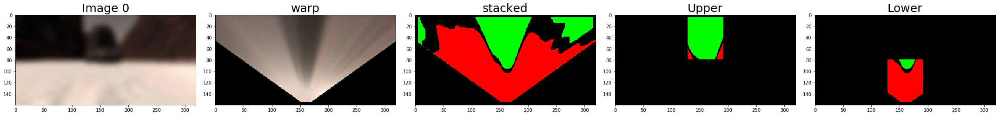

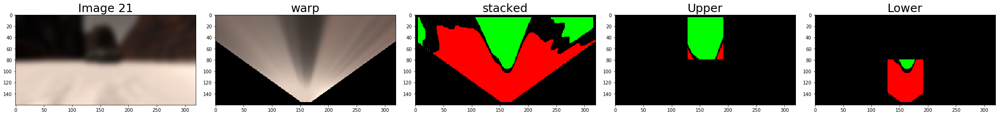

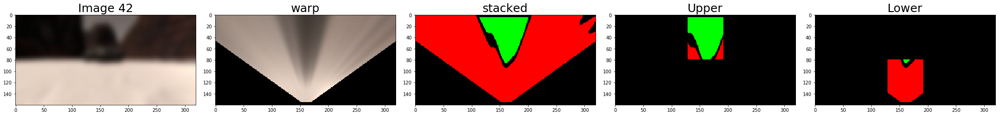

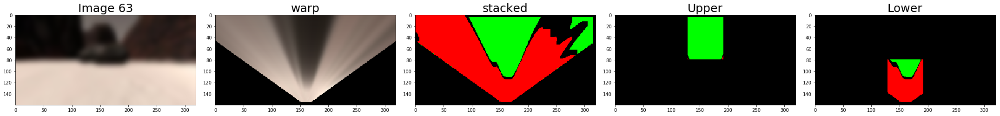

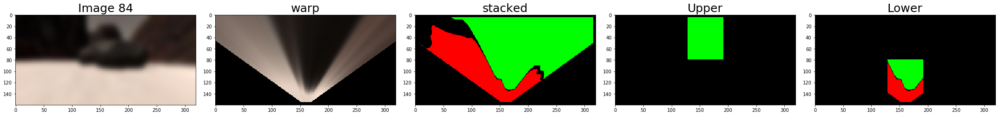

...

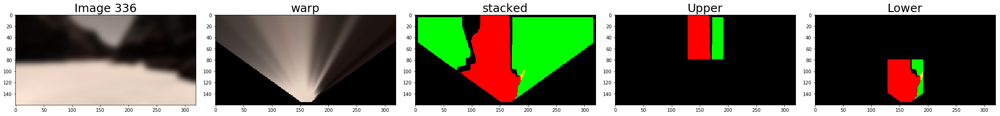

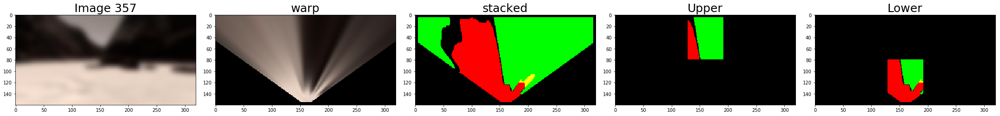

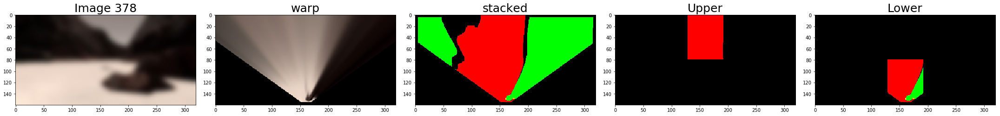

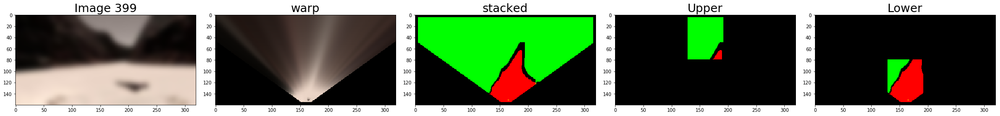

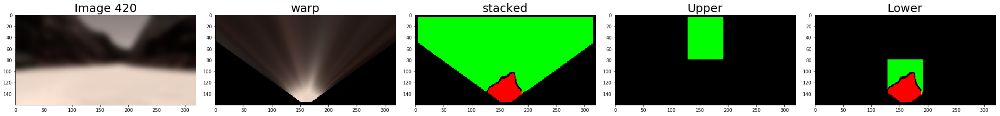

In [431]:
rock_path = '../test_dataset/rock_IMG/*'
img_rock_list = glob.glob(rock_path)

def warpTop(img):
    warped = stacked_threshold(img)
    
    return maskImg(warped, maskUpperRock(img))

def warpBottom(img):
    warped = stacked_threshold(img)
    
    return maskImg(warped, maskLowerRock(img))

n = len(img_rock_list)
for i in range(0,n, n//20):
    img = mpimg.imread(img_rock_list[i])
    vis_functions(blurImg(img), [lambda x: x, warpImg, stacked_threshold, warpTop, warpBottom], ["Image " + str(i), "warp", "stacked", "Upper", "Lower"])

ZeroDivisionError: float division by zero

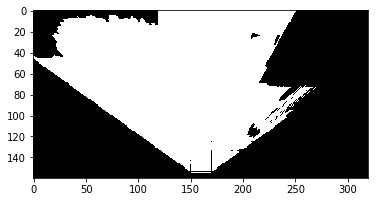

In [32]:
# Identify pixels above the threshold
# Threshold of RGB > 160 does a nice job of identifying ground pixels only
def color_thresh(img, rgb_thresh=(160, 160, 160)):
    # Create an array of zeros same xy size as img, but single channel
    color_select = np.zeros_like(img[:,:,0])
    # Require that each pixel be above all three threshold values in RGB
    # above_thresh will now contain a boolean array with "True"
    # where threshold was met
    above_thresh = (img[:,:,0] > rgb_thresh[0]) \
                & (img[:,:,1] > rgb_thresh[1]) \
                & (img[:,:,2] > rgb_thresh[2])
    # Index the array of zeros with the boolean array and set to 1
    color_select[above_thresh] = 1
    # Return the binary image
    return color_select

threshed = color_thresh(warped)
plt.imshow(threshed, cmap='gray')

im2,contours,hierarchy = cv2.findContours(threshed, 1, 2)
cnt = contours[0]
M = cv2.moments(cnt)
cx = int(M['m10']/M['m00'])
cy = int(M['m01']/M['m00'])

print(cx, cy)
#scipy.misc.imsave('../output/warped_threshed.jpg', threshed*255)

## Coordinate Transformations
Define the functions used to do coordinate transforms and apply them to an image.

C:\Users\kmath\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel\__main__.py:58: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


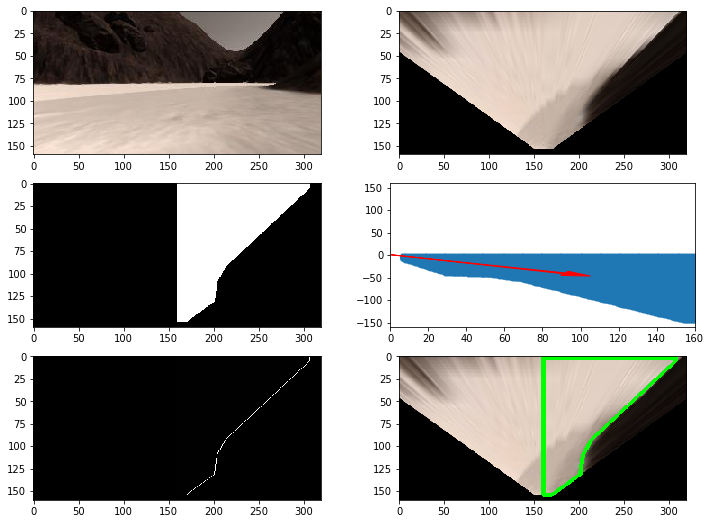

In [126]:
def rover_coords(binary_img):
    # Identify nonzero pixels
    ypos, xpos = binary_img.nonzero()
    # Calculate pixel positions with reference to the rover position being at the 
    # center bottom of the image.  
    x_pixel = np.absolute(ypos - binary_img.shape[0]).astype(np.float)
    y_pixel = -(xpos - binary_img.shape[0]).astype(np.float)
    return x_pixel, y_pixel

# Define a function to convert to radial coords in rover space
def to_polar_coords(x_pixel, y_pixel):
    # Convert (x_pixel, y_pixel) to (distance, angle) 
    # in polar coordinates in rover space
    # Calculate distance to each pixel
    dist = np.sqrt(x_pixel**2 + y_pixel**2)
    # Calculate angle away from vertical for each pixel
    angles = np.arctan2(y_pixel, x_pixel)
    return dist, angles

# Define a function to apply a rotation to pixel positions
def rotate_pix(xpix, ypix, yaw):
    # Convert yaw to radians and apply rotation
    yaw_rad = yaw * np.pi / 180.0
    xpix_rotated = xpix * np.cos(yaw_rad) - ypix * np.sin(yaw_rad)
    ypix_rotated = xpix * np.sin(yaw_rad) + ypix * np.cos(yaw_rad)
    
    return xpix_rotated, ypix_rotated

# Define a function to perform a translation
def translate_pix(xpix_rot, ypix_rot, xpos, ypos, scale): 
    # Apply a scaling and a translation
    xpix_translated = np.int_(xpos + xpix_rot/scale)
    ypix_translated = np.int_(ypos + ypix_rot/scale)
    
    return xpix_translated, ypix_translated

# Define a function to apply rotation and translation (and clipping)
# Once you define the two functions above this function should work
def pix_to_world(xpix, ypix, xpos, ypos, yaw, world_size, scale):
    # Apply rotation
    xpix_rot, ypix_rot = rotate_pix(xpix, ypix, yaw)
    # Apply translation
    xpix_tran, ypix_tran = translate_pix(xpix_rot, ypix_rot, xpos, ypos, scale)
    # Perform rotation, translation and clipping all at once
    x_pix_world = np.clip(np.int_(xpix_tran), 0, world_size - 1)
    y_pix_world = np.clip(np.int_(ypix_tran), 0, world_size - 1)
    # Return the result
    return x_pix_world, y_pix_world

# Grab another random image
idx = np.random.randint(0, len(img_list)-1)
image = mpimg.imread(img_list[idx])
warped = perspect_transform(image, source, destination)
threshed = sand_threshold(warped)

# Calculate pixel values in rover-centric coords and distance/angle to all pixels
mask = np.zeros_like(threshed[:,:])
mask[:, mask.shape[1]/2:] = 1
threshed = cv2.bitwise_and(threshed,threshed, mask=mask)
xpix, ypix = rover_coords(threshed)
dist, angles = to_polar_coords(xpix, ypix)
mean_dir = np.mean(angles)

# Do some plotting
fig = plt.figure(figsize=(12,9))
plt.subplot(321)
plt.imshow(image)
plt.subplot(322)
plt.imshow(warped)
plt.subplot(323)
plt.imshow(threshed, cmap='gray')
plt.subplot(324)
plt.plot(xpix, ypix, '.')
plt.ylim(-160, 160)
plt.xlim(0, 160)
arrow_length = 100
x_arrow = arrow_length * np.cos(mean_dir)
y_arrow = arrow_length * np.sin(mean_dir)
plt.arrow(0, 0, x_arrow, y_arrow, color='red', zorder=2, head_width=10, width=2)

im2,contours,hierarchy = cv2.findContours(np.copy(threshed),cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
im3 = threshed
warped_withContor = np.copy(warped)
cv2.drawContours(warped_withContor, contours, 0, (0,255,0), 3)


plt.subplot(325)
plt.imshow(im2, cmap='gray')

plt.subplot(326)
plt.imshow(warped_withContor)

## Read in saved data and ground truth map of the world
The next cell is all setup to read your saved data into a `pandas` dataframe.  Here you'll also read in a "ground truth" map of the world, where white pixels (pixel value = 1) represent navigable terrain.  

After that, we'll define a class to store telemetry data and pathnames to images.  When you instantiate this class (`data = Databucket()`) you'll have a global variable called `data` that you can refer to for telemetry and map data within the `process_image()` function in the following cell.  


In [115]:
# Import pandas and read in csv file as a dataframe
import pandas as pd
# Change this path to your data directory
df = pd.read_csv('../test_dataset/robot_log.csv')
csv_img_list = df["Path"].tolist() # Create list of image pathnames
# Read in ground truth map and create a 3-channel image with it
ground_truth = mpimg.imread('../calibration_images/map_bw.png')
ground_truth_3d = np.dstack((ground_truth*0, ground_truth*255, ground_truth*0)).astype(np.float)

# Creating a class to be the data container
# Will read in saved data from csv file and populate this object
# Worldmap is instantiated as 200 x 200 grids corresponding 
# to a 200m x 200m space (same size as the ground truth map: 200 x 200 pixels)
# This encompasses the full range of output position values in x and y from the sim
class Databucket():
    def __init__(self):
        self.images = csv_img_list  
        self.xpos = df["X_Position"].values
        self.ypos = df["Y_Position"].values
        self.yaw = df["Yaw"].values
        self.count = -1 # This will be a running index, setting to -1 is a hack
                        # because moviepy (below) seems to run one extra iteration
        self.worldmap = np.zeros((200, 200, 3)).astype(np.float)
        self.ground_truth = ground_truth_3d # Ground truth worldmap

# Instantiate a Databucket().. this will be a global variable/object
# that you can refer to in the process_image() function below
data = Databucket()


## Write a function to process stored images

Modify the `process_image()` function below by adding in the perception step processes (functions defined above) to perform image analysis and mapping.  The following cell is all set up to use this `process_image()` function in conjunction with the `moviepy` video processing package to create a video from the images you saved taking data in the simulator.  

In short, you will be passing individual images into `process_image()` and building up an image called `output_image` that will be stored as one frame of video.  You can make a mosaic of the various steps of your analysis process and add text as you like (example provided below).  



To start with, you can simply run the next three cells to see what happens, but then go ahead and modify them such that the output video demonstrates your mapping process.  Feel free to get creative!

In [287]:

# Define a function to pass stored images to
# reading rover position and yaw angle from csv file
# This function will be used by moviepy to create an output video

def convertFindings2world(threshold):
    # 4) Convert thresholded image pixel values to rover-centric coords
    x_pixels, y_pixels = rover_coords(threshold)
    # 5) Convert rover-centric pixel values to world coords
    worldsize = 200
    scale = 10
    x_world, y_world = pix_to_world(x_pixels, y_pixels, data.xpos[data.count], data.ypos[data.count], data.yaw[data.count], worldsize, scale)

    return x_world, y_world

def process_image(img):
    # Example of how to use the Databucket() object defined above
    # to print the current x, y and yaw values 
    # print(data.xpos[data.count], data.ypos[data.count], data.yaw[data.count])

    # TODO: 
    # 1) Define source and destination points for perspective transform
    # 2) Apply perspective transform
    warped = perspect_transform(img, source, destination)
    # 3) Apply color threshold to identify navigable terrain/obstacles/rock samples
    sand = sand_threshold(warped)
    rock = rock_threshold(warped)
    ball = ball_threshold(warped)
    
    sand_x_world, sand_y_world = convertFindings2world(sand)
    rock_x_world, rock_y_world = convertFindings2world(rock)
    ball_x_world, ball_y_world = convertFindings2world(ball)
    # 6) Update worldmap (to be displayed on right side of screen)
        # Example: data.worldmap[obstacle_y_world, obstacle_x_world, 0] += 1
        #          data.worldmap[rock_y_world, rock_x_world, 1] += 1
        #          data.worldmap[navigable_y_world, navigable_x_world, 2] += 1
    for x, y in zip(rock_x_world, rock_y_world):
        data.worldmap[y, x, 0] += 1
    for x, y in zip(ball_x_world, ball_y_world):
        data.worldmap[y, x, 1] += 1
    for x, y in zip(sand_x_world, sand_y_world):
        data.worldmap[y, x, 2] += 1
    # 7) Make a mosaic image, below is some example code
        # First create a blank image (can be whatever shape you like)
    output_image = np.zeros((img.shape[0] + data.worldmap.shape[0], img.shape[1]*2, 3))
        # Next you can populate regions of the image with various output
        # Here I'm putting the original image in the upper left hand corner
    output_image[0:img.shape[0], 0:img.shape[1]] = img

        # Let's create more images to add to the mosaic, first a warped image
    warped = perspect_transform(img, source, destination)
        # Add the warped image in the upper right hand corner
    output_image[0:img.shape[0], img.shape[1]:] = warped

        # Overlay worldmap with ground truth map
    map_add = cv2.addWeighted(data.worldmap, 1, data.ground_truth, 0.5, 0)
        # Flip map overlay so y-axis points upward and add to output_image 
    output_image[img.shape[0]:, 0:data.worldmap.shape[1]] = np.flipud(map_add)

    
        # Then putting some text over the image
    cv2.putText(output_image,"Populate this image with your analyses to make a video!", (20, 20), 
                cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 255, 255), 1)
    data.count += 1 # Keep track of the index in the Databucket()
    
    return output_image

## Make a video from processed image data
Use the [moviepy](https://zulko.github.io/moviepy/) library to process images and create a video.
  

In [289]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from moviepy.editor import ImageSequenceClip


# Define pathname to save the output video
output = '../output/test_mapping2.mp4'
data = Databucket() # Re-initialize data in case you're running this cell multiple times
clip = ImageSequenceClip(data.images, fps=60) # Note: output video will be sped up because 
                                          # recording rate in simulator is fps=25
new_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
%time new_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video ../output/test_mapping2.mp4
[MoviePy] Writing video ../output/test_mapping2.mp4


100%|██████████| 283/283 [00:07<00:00, 36.65it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../output/test_mapping2.mp4 

Wall time: 7.89 s


### This next cell should function as an inline video player
If this fails to render the video, try running the following cell (alternative video rendering method).  You can also simply have a look at the saved mp4 in your `/output` folder

In [118]:

from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

### Below is an alternative way to create a video in case the above cell did not work.

In [12]:
import io
import base64
video = io.open(output, 'r+b').read()
encoded_video = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded_video.decode('ascii')))